In [1]:
#importing the dataset to check the pollution of air quality

In [2]:
import pandas as pd
import numpy as np
from datetime import datetime
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
df = pd.read_csv('city_day.csv')

In [5]:
df.shape

(29531, 16)

In [6]:
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [7]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [8]:
# Handling the missing Values

In [9]:
df.isnull().sum()

City              0
Date              0
PM2.5          4598
PM10          11140
NO             3582
NO2            3585
NOx            4185
NH3           10328
CO             2059
SO2            3854
O3             4022
Benzene        5623
Toluene        8041
Xylene        18109
AQI            4681
AQI_Bucket     4681
dtype: int64

In [10]:
df.isnull().sum()*100/len(df)

City           0.000000
Date           0.000000
PM2.5         15.570079
PM10          37.723071
NO            12.129626
NO2           12.139785
NOx           14.171549
NH3           34.973418
CO             6.972334
SO2           13.050692
O3            13.619586
Benzene       19.041008
Toluene       27.229014
Xylene        61.322001
AQI           15.851139
AQI_Bucket    15.851139
dtype: float64

In [11]:
#to know the num_feature,dis_feature,con_feature,cat_feature in given dataset and handling the missing values

In [12]:
num_feature = [feature for feature in df.columns if df[feature].dtypes !='O']
dis_feature = [feature for feature in df.columns if len(df[feature].unique()) >=25]
con_feature = [feature for feature in df.columns if feature not in dis_feature]
cat_feature = [feature for feature in df.columns if feature not in num_feature ]
print("The Numerical feature : {}".format(len(num_feature)))
print("The Categotical feature :" , len(cat_feature))
print("The Continous feature :" , len(con_feature))
print("The Distcerte feature :" , len(dis_feature))


The Numerical feature : 13
The Categotical feature : 3
The Continous feature : 1
The Distcerte feature : 15


In [13]:
num_feature

['PM2.5',
 'PM10',
 'NO',
 'NO2',
 'NOx',
 'NH3',
 'CO',
 'SO2',
 'O3',
 'Benzene',
 'Toluene',
 'Xylene',
 'AQI']

In [14]:
dis_feature

['City',
 'Date',
 'PM2.5',
 'PM10',
 'NO',
 'NO2',
 'NOx',
 'NH3',
 'CO',
 'SO2',
 'O3',
 'Benzene',
 'Toluene',
 'Xylene',
 'AQI']

In [15]:
con_feature

['AQI_Bucket']

In [16]:
cat_feature

['City', 'Date', 'AQI_Bucket']

In [17]:
for feature in num_feature:
        df[feature] = df[feature].fillna(df[feature].mean())

In [18]:
df.isnull().sum()*100/len(df)

City           0.000000
Date           0.000000
PM2.5          0.000000
PM10           0.000000
NO             0.000000
NO2            0.000000
NOx            0.000000
NH3            0.000000
CO             0.000000
SO2            0.000000
O3             0.000000
Benzene        0.000000
Toluene        0.000000
Xylene         0.000000
AQI            0.000000
AQI_Bucket    15.851139
dtype: float64

In [19]:
df = df.dropna()

In [20]:
df.isnull().sum()*100/len(df)

City          0.0
Date          0.0
PM2.5         0.0
PM10          0.0
NO            0.0
NO2           0.0
NOx           0.0
NH3           0.0
CO            0.0
SO2           0.0
O3            0.0
Benzene       0.0
Toluene       0.0
Xylene        0.0
AQI           0.0
AQI_Bucket    0.0
dtype: float64

In [21]:
df.duplicated()

28       False
29       False
30       False
31       False
32       False
         ...  
29526    False
29527    False
29528    False
29529    False
29530    False
Length: 24850, dtype: bool

In [22]:
sum(df.duplicated())

0

In [23]:
df.head(1)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
28,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.0,3.14,209.0,Poor


In [24]:
df = df.reset_index()

In [25]:
df.head(3)

,index,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,28,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,Poor
1,29,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,Very Poor
2,30,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,Severe


In [26]:
df.drop('index', inplace= True, axis = 1)

In [27]:
df.head(3)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,Poor
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,Very Poor
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,Severe


In [28]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000
mean,67.475903,118.361096,17.621678,28.971818,32.290515,23.752394,2.343536,14.367049,34.899199,3.433371,9.332356,3.267909,166.463581
std,62.208948,75.660501,22.245860,24.432587,29.542968,22.214343,7.011582,17.215237,21.368979,14.851776,18.273322,4.178816,140.696585
min,0.040000,0.030000,0.030000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,29.560000,71.780000,5.720000,12.090000,14.030000,11.280000,0.590000,5.790000,19.640000,0.340000,1.580000,2.650000,81.000000
50%,50.165000,118.127103,10.075000,22.535000,25.720000,23.483476,0.950000,9.430000,32.060000,1.810000,6.790000,3.070128,118.000000
75%,79.507500,122.957500,19.710000,37.910000,38.170000,24.710000,1.530000,14.890000,45.397500,3.280840,8.700972,3.070128,208.000000
max,914.940000,917.080000,390.680000,362.210000,378.240000,352.890000,175.810000,186.080000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [29]:
#to know the max, min of the given feature in a given dataset

In [30]:
print("The Min o3 Air Pollution is ", df.O3.min())
print("The Max O3 Air Pollution is ", df.O3.max())

The Min o3 Air Pollution is  0.01
The Max O3 Air Pollution is  257.73


In [31]:
print("The Min PM2.5 Air Pollution is ", df['PM2.5'].min())
print("The MAX PM2.5 Air Pollution is ", df['PM2.5'].max())

The Min PM2.5 Air Pollution is  0.04
The MAX PM2.5 Air Pollution is  914.94


In [32]:
print("The Min PM10 Air Pollution is ", df['PM10'].min())
print("The MAX PM10 Air Pollution is ", df['PM10'].max())

The Min PM10 Air Pollution is  0.03
The MAX PM10 Air Pollution is  917.08


In [33]:
print("The Min NO Air Pollution is ", df['NO'].min())
print("The MAX NO Air Pollution is ", df['NO'].max())

The Min NO Air Pollution is  0.03
The MAX NO Air Pollution is  390.68


In [34]:
print("The Min NO2 Air Pollution is ", df['NO2'].min())
print("The MAX NO2 Air Pollution is ", df['NO2'].max())

The Min NO2 Air Pollution is  0.01
The MAX NO2 Air Pollution is  362.21


In [35]:
print("The Min NOx Air Pollution is ", df['NOx'].min())
print("The MAX NOx Air Pollution is ", df['NOx'].max())

The Min NOx Air Pollution is  0.0
The MAX NOx Air Pollution is  378.24


In [36]:
print("The Min NH3 Air Pollution is ", df['NH3'].min())
print("The MAX NH3 Air Pollution is ", df['NH3'].max())

The Min NH3 Air Pollution is  0.01
The MAX NH3 Air Pollution is  352.89


In [37]:
print("The Min CO Air Pollution is ", df['CO'].min())
print("The MAX CO Air Pollution is ", df['CO'].max())

The Min CO Air Pollution is  0.0
The MAX CO Air Pollution is  175.81


In [38]:
print("The Min SO2 Air Pollution is ", df['SO2'].min())
print("The MAX SO2 Air Pollution is ", df['SO2'].max())

The Min SO2 Air Pollution is  0.01
The MAX SO2 Air Pollution is  186.08


In [39]:
print("The Min Benzene Air Pollution is ", df['Benzene'].min())
print("The MAX Benzene Air Pollution is ", df['Benzene'].max())

The Min Benzene Air Pollution is  0.0
The MAX Benzene Air Pollution is  455.03


In [40]:
print("The Min Toluene Air Pollution is ", df['Toluene'].min())
print("The MAX Toluene Air Pollution is ", df['Toluene'].max())

The Min Toluene Air Pollution is  0.0
The MAX Toluene Air Pollution is  454.85


In [41]:
print("The Min Xylene  Air Pollution is ", df['Xylene'].min())
print("The MAX Xylene Air Pollution is ", df['Xylene'].max())

The Min Xylene  Air Pollution is  0.0
The MAX Xylene Air Pollution is  170.37


In [42]:
print("The Min AQI  Air Pollution is ", df['AQI'].min())
print("The MAX AQI Air Pollution is ", df['AQI'].max())

The Min AQI  Air Pollution is  13.0
The MAX AQI Air Pollution is  2049.0


In [43]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000
mean,67.475903,118.361096,17.621678,28.971818,32.290515,23.752394,2.343536,14.367049,34.899199,3.433371,9.332356,3.267909,166.463581
std,62.208948,75.660501,22.245860,24.432587,29.542968,22.214343,7.011582,17.215237,21.368979,14.851776,18.273322,4.178816,140.696585
min,0.040000,0.030000,0.030000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,29.560000,71.780000,5.720000,12.090000,14.030000,11.280000,0.590000,5.790000,19.640000,0.340000,1.580000,2.650000,81.000000
50%,50.165000,118.127103,10.075000,22.535000,25.720000,23.483476,0.950000,9.430000,32.060000,1.810000,6.790000,3.070128,118.000000
75%,79.507500,122.957500,19.710000,37.910000,38.170000,24.710000,1.530000,14.890000,45.397500,3.280840,8.700972,3.070128,208.000000
max,914.940000,917.080000,390.680000,362.210000,378.240000,352.890000,175.810000,186.080000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [44]:
#to handle the outliers and check for anamolies

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24850 entries, 0 to 24849
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        24850 non-null  object 
 1   Date        24850 non-null  object 
 2   PM2.5       24850 non-null  float64
 3   PM10        24850 non-null  float64
 4   NO          24850 non-null  float64
 5   NO2         24850 non-null  float64
 6   NOx         24850 non-null  float64
 7   NH3         24850 non-null  float64
 8   CO          24850 non-null  float64
 9   SO2         24850 non-null  float64
 10  O3          24850 non-null  float64
 11  Benzene     24850 non-null  float64
 12  Toluene     24850 non-null  float64
 13  Xylene      24850 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.0+ MB


C:\Users\HI\anaconda3\lib\site-packages\seaborn\categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


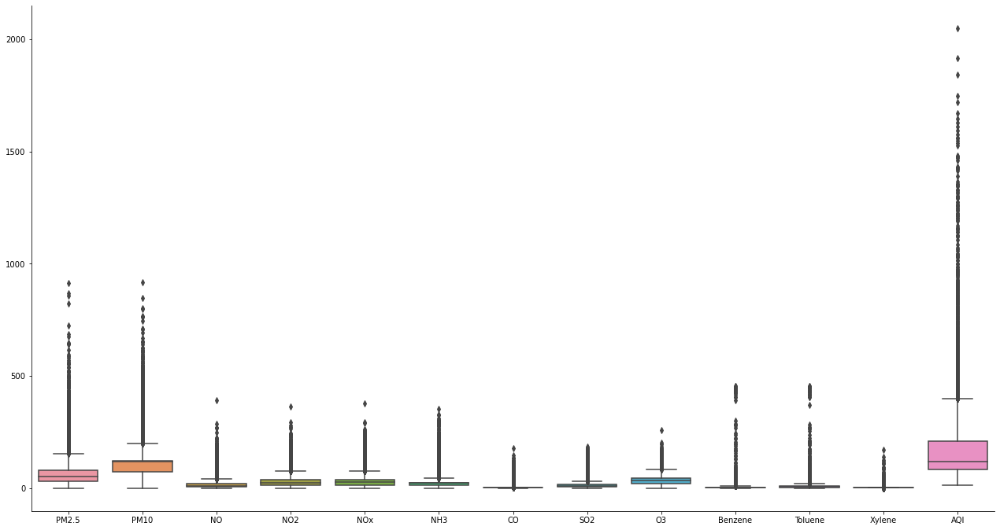

In [46]:
figure = sns.factorplot(data = df, kind = 'box')

figure.fig.set_size_inches(20,10)

In [47]:
q1 = df.quantile(0.25)
q3 = df.quantile(0.75)
IQR = q3-q1

In [48]:
IQR

PM2.5       49.947500
PM10        51.177500
NO          13.990000
NO2         25.820000
NOx         24.140000
NH3         13.430000
CO           0.940000
SO2          9.100000
O3          25.757500
Benzene      2.940840
Toluene      7.120972
Xylene       0.420128
AQI        127.000000
dtype: float64

In [49]:
min_threshold,max_threshold = df['AQI'].quantile([0.001, 0.999])

In [50]:
min_threshold,max_threshold

(19.0, 1415.359000000015)

In [51]:
df2 = df[(df['AQI']<max_threshold)& (df['AQI']>min_threshold )]

In [52]:
df2

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02000,0.000000,3.140000,209.0,Poor
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04000,0.000000,4.810000,328.0,Very Poor
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24000,0.010000,7.670000,514.0,Severe
3,Ahmedabad,2015-02-01,135.99,118.127103,43.48,42.08,84.57,23.483476,43.48,75.23,102.70,0.40000,0.040000,25.870000,782.0,Severe
4,Ahmedabad,2015-02-02,178.33,118.127103,54.56,35.31,72.80,23.483476,54.56,55.04,107.38,0.46000,0.060000,35.610000,914.0,Severe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24845,Visakhapatnam,2020-06-27,15.02,50.940000,7.68,25.06,19.54,12.470000,0.47,8.55,23.30,2.24000,12.070000,0.730000,41.0,Good
24846,Visakhapatnam,2020-06-28,24.38,74.090000,3.42,26.06,16.53,11.990000,0.52,12.72,30.14,0.74000,2.210000,0.380000,70.0,Satisfactory
24847,Visakhapatnam,2020-06-29,22.91,65.730000,3.45,29.53,18.33,10.710000,0.48,8.42,30.96,0.01000,0.010000,0.000000,68.0,Satisfactory
24848,Visakhapatnam,2020-06-30,16.64,49.970000,4.05,29.26,18.80,10.030000,0.52,9.84,28.30,0.00000,0.000000,0.000000,54.0,Satisfactory


In [53]:
df['Year'] = pd.DatetimeIndex(df['Date']).year

In [54]:
df['Month'] = pd.DatetimeIndex(df['Date']).month

In [55]:
#data visulization on given dataset

<AxesSubplot:xlabel='AQI_Bucket', ylabel='count'>

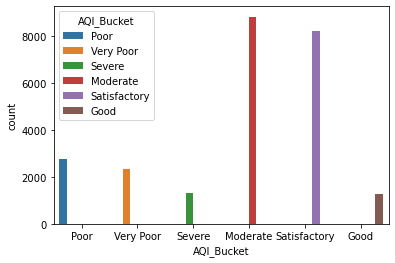

In [56]:
sns.countplot(x = 'AQI_Bucket',data = df2, hue = 'AQI_Bucket')

<AxesSubplot:title={'center':'city that highest ozone'}, xlabel='City', ylabel='O3'>

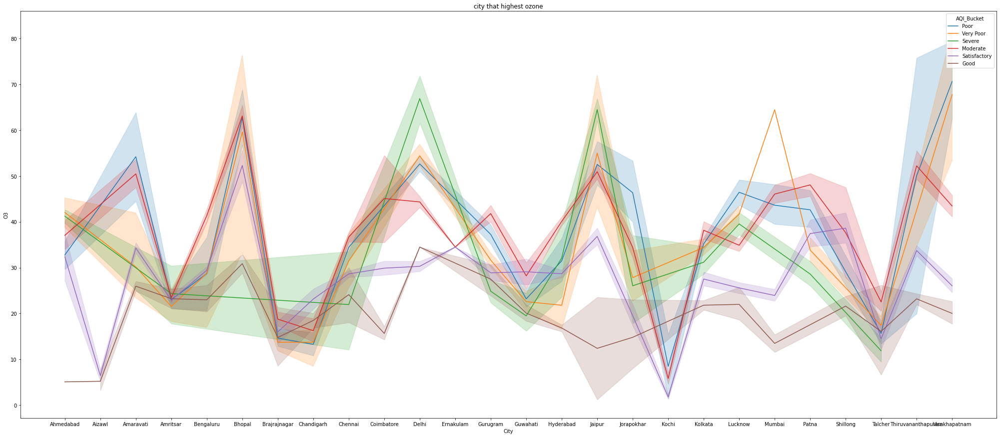

In [57]:
fig = plt.figure(figsize=(35,15))
plt.title('city that highest ozone')
sns.lineplot(data = df2,x=df2['City'],y=df2['O3'],hue='AQI_Bucket')

<AxesSubplot:title={'center':'city that highest Benzene'}, xlabel='City', ylabel='Benzene'>

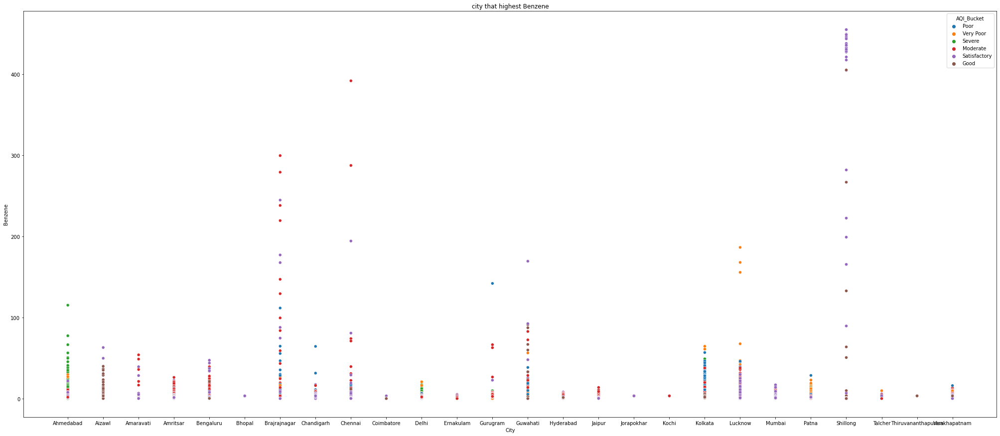

In [58]:
fig = plt.figure(figsize=(35,15))
plt.title('city that highest Benzene')
sns.scatterplot(data = df2,x=df['City'],y=df['Benzene'],hue='AQI_Bucket')

<AxesSubplot:title={'center':'City that highest Xylene'}, xlabel='City', ylabel='Xylene'>

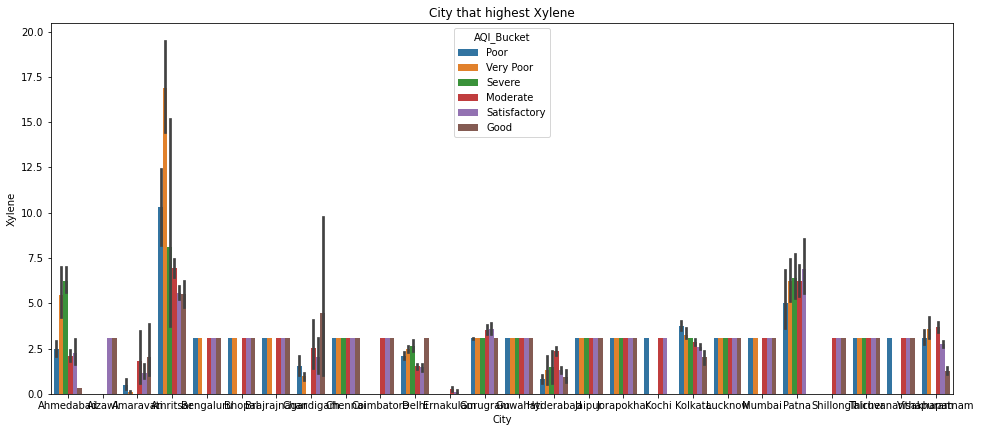

In [59]:
fig = plt.figure(figsize=(55,15))
plt.subplot(233)
plt.title('City that highest Xylene')
sns.barplot(data = df,x=df2['City'],y=df['Xylene'],hue='AQI_Bucket')

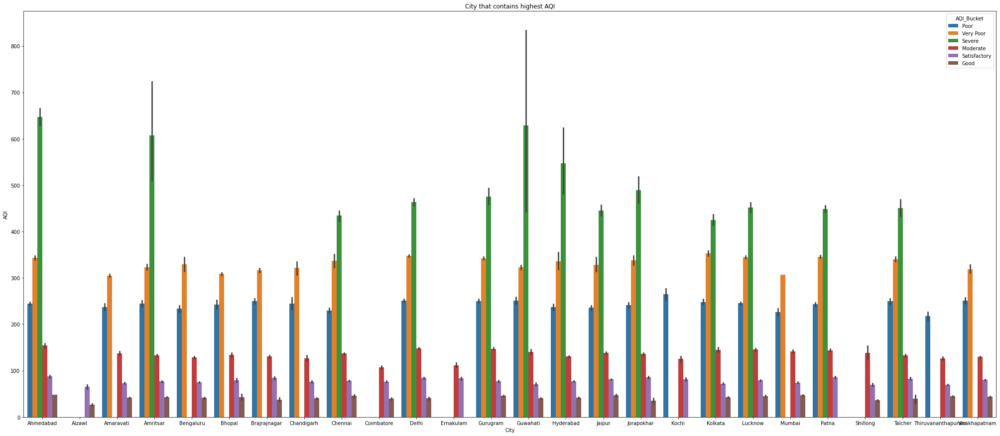

In [60]:
fig = plt.figure(figsize=(35,15))
plt.title('City that contains highest AQI')
sns.barplot(data = df,x=df2['City'],y=df['AQI'],hue='AQI_Bucket')
plt.show()

In [61]:
fig = px.bar(x=df['AQI_Bucket'], y= df['Month'], color =df['Month'])
fig.show()

In [62]:
fig = px.bar(x=df['AQI_Bucket'], y= df['Month'], color =df['Month'])
fig.show()

In [147]:
fig = px.bar(x=df['Date'], y= df['AQI_Bucket'], color =df['AQI_Bucket'])
fig.show()

In [64]:
fig = px.bar(x=df['City'], y= df['NOx'], color =df['NOx'])
fig.show()

In [65]:
fig = px.bar(x=df['City'], y= df['Benzene'], color =df['Benzene'])
fig.show()

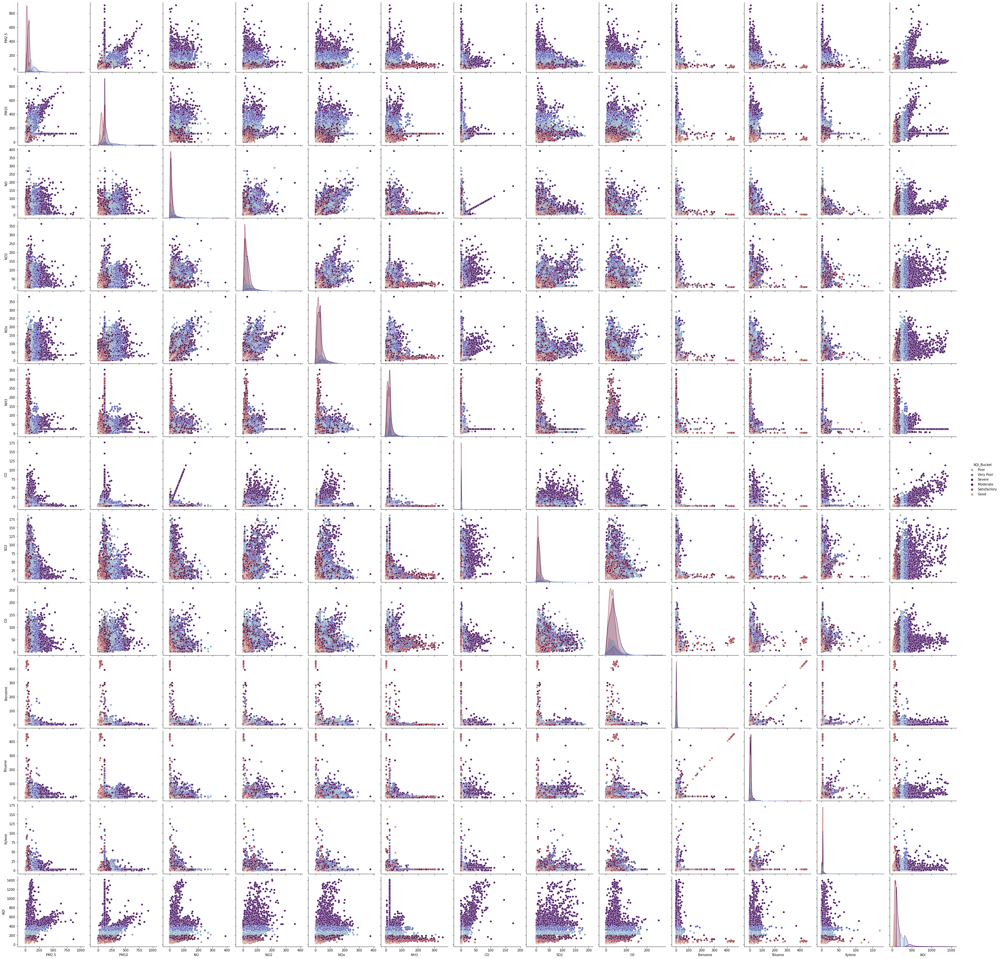

In [66]:
sns.pairplot(data = df2,hue = 'AQI_Bucket',height=3.2, palette = 'twilight' )

In [67]:
df2.isnull().sum()*100/len(df)

City          0.0
Date          0.0
PM2.5         0.0
PM10          0.0
NO            0.0
NO2           0.0
NOx           0.0
NH3           0.0
CO            0.0
SO2           0.0
O3            0.0
Benzene       0.0
Toluene       0.0
Xylene        0.0
AQI           0.0
AQI_Bucket    0.0
dtype: float64

In [68]:
#Correlation Matrix with Heatmap

Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

<AxesSubplot:>

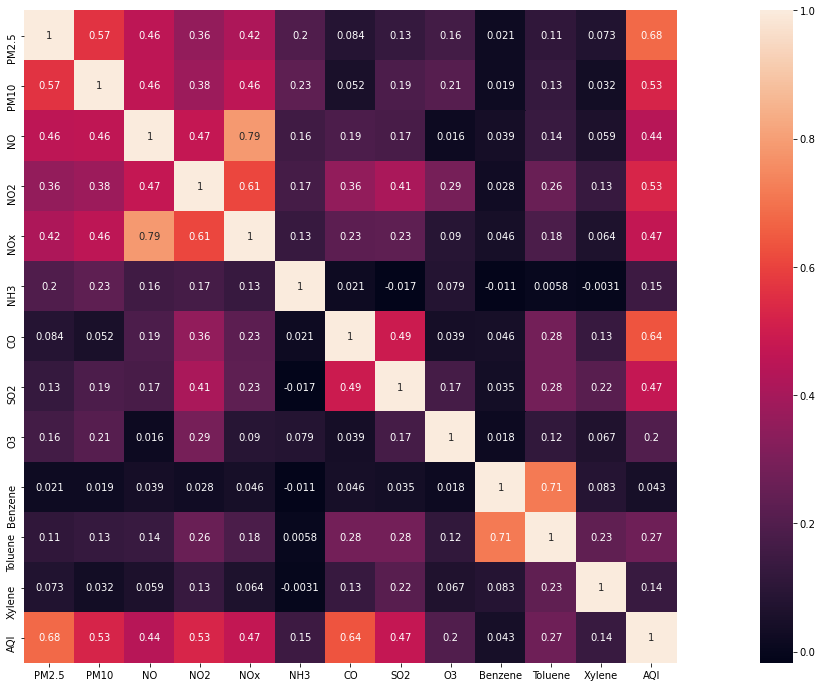

In [69]:
corr_mat=df2.corr()
mask=np.array(corr_mat)
fig=plt.gcf()
fig.set_size_inches(30,12)
sns.heatmap(data=corr_mat,annot=True,cbar=True,square=True)

In [70]:
#to count the valuses and arrange the desecinding and visualize

In [71]:
cites = df2.groupby(df2['City']).agg({'AQI_Bucket':'count'})

In [72]:
dft = df2.copy()

In [73]:
dft.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,Poor
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,Very Poor
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,Severe
3,Ahmedabad,2015-02-01,135.99,118.127103,43.48,42.08,84.57,23.483476,43.48,75.23,102.70,0.40,0.04,25.87,782.0,Severe
4,Ahmedabad,2015-02-02,178.33,118.127103,54.56,35.31,72.80,23.483476,54.56,55.04,107.38,0.46,0.06,35.61,914.0,Severe


In [74]:
dft = dft.set_index(['City','Date']).count(level = "City")

In [75]:
dft

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
City,,,,,,,,,,,,,,
Ahmedabad,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309
Aizawl,85,85,85,85,85,85,85,85,85,85,85,85,85,85
Amaravati,841,841,841,841,841,841,841,841,841,841,841,841,841,841
Amritsar,1126,1126,1126,1126,1126,1126,1126,1126,1126,1126,1126,1126,1126,1126
Bengaluru,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910
Bhopal,278,278,278,278,278,278,278,278,278,278,278,278,278,278
Brajrajnagar,713,713,713,713,713,713,713,713,713,713,713,713,713,713
Chandigarh,299,299,299,299,299,299,299,299,299,299,299,299,299,299
Chennai,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884


In [76]:
dft= dft.sort_values(by='AQI_Bucket',ascending=False)

In [77]:
dft

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
City,,,,,,,,,,,,,,
Delhi,1999,1999,1999,1999,1999,1999,1999,1999,1999,1999,1999,1999,1999,1999
Bengaluru,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910,1910
Lucknow,1893,1893,1893,1893,1893,1893,1893,1893,1893,1893,1893,1893,1893,1893
Chennai,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884
Hyderabad,1880,1880,1880,1880,1880,1880,1880,1880,1880,1880,1880,1880,1880,1880
Patna,1459,1459,1459,1459,1459,1459,1459,1459,1459,1459,1459,1459,1459,1459
Gurugram,1453,1453,1453,1453,1453,1453,1453,1453,1453,1453,1453,1453,1453,1453
Ahmedabad,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309,1309
Visakhapatnam,1171,1171,1171,1171,1171,1171,1171,1171,1171,1171,1171,1171,1171,1171


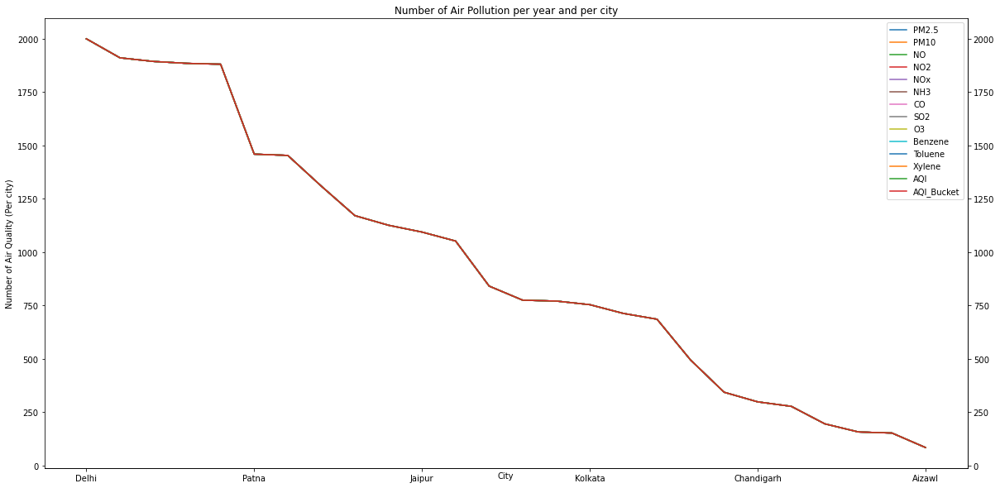

<Figure size 1440x720 with 0 Axes>

In [78]:
fig=plt.figure()
a = fig.add_subplot(111,label="1")
b = fig.add_subplot(111,label="2")
plt.figure(figsize=(20,10))
dft.plot(figsize=(20,10), ax=a,title="Number of Air Pollution per year and per city")
a.set_ylabel('Number of Air Quality (Per city)')
a.set_xlabel("")
dft.plot(ax=b)
b.set_xticks([])
b.yaxis.tick_right()
b.set_xlabel('City') 
plt.show()  

In [79]:
cities = cites.sort_values(by='AQI_Bucket',ascending=False)

In [80]:
cities 

,AQI_Bucket
City,
Delhi,1999
Bengaluru,1910
Lucknow,1893
Chennai,1884
Hyderabad,1880
Patna,1459
Gurugram,1453
Ahmedabad,1309
Visakhapatnam,1171


In [81]:
def fig_plot(cites,title):
    fig = px.line(title = title)
    for i in cities.columns[0:]:
        fig.add_bar(x=cities.index, y = cities['AQI_Bucket'],name =i)
    fig.show()

In [82]:
fig_plot(cites, 'Air Pollution around the cities')

In [83]:
df2.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,Poor
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,Very Poor
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,Severe
3,Ahmedabad,2015-02-01,135.99,118.127103,43.48,42.08,84.57,23.483476,43.48,75.23,102.70,0.40,0.04,25.87,782.0,Severe
4,Ahmedabad,2015-02-02,178.33,118.127103,54.56,35.31,72.80,23.483476,54.56,55.04,107.38,0.46,0.06,35.61,914.0,Severe


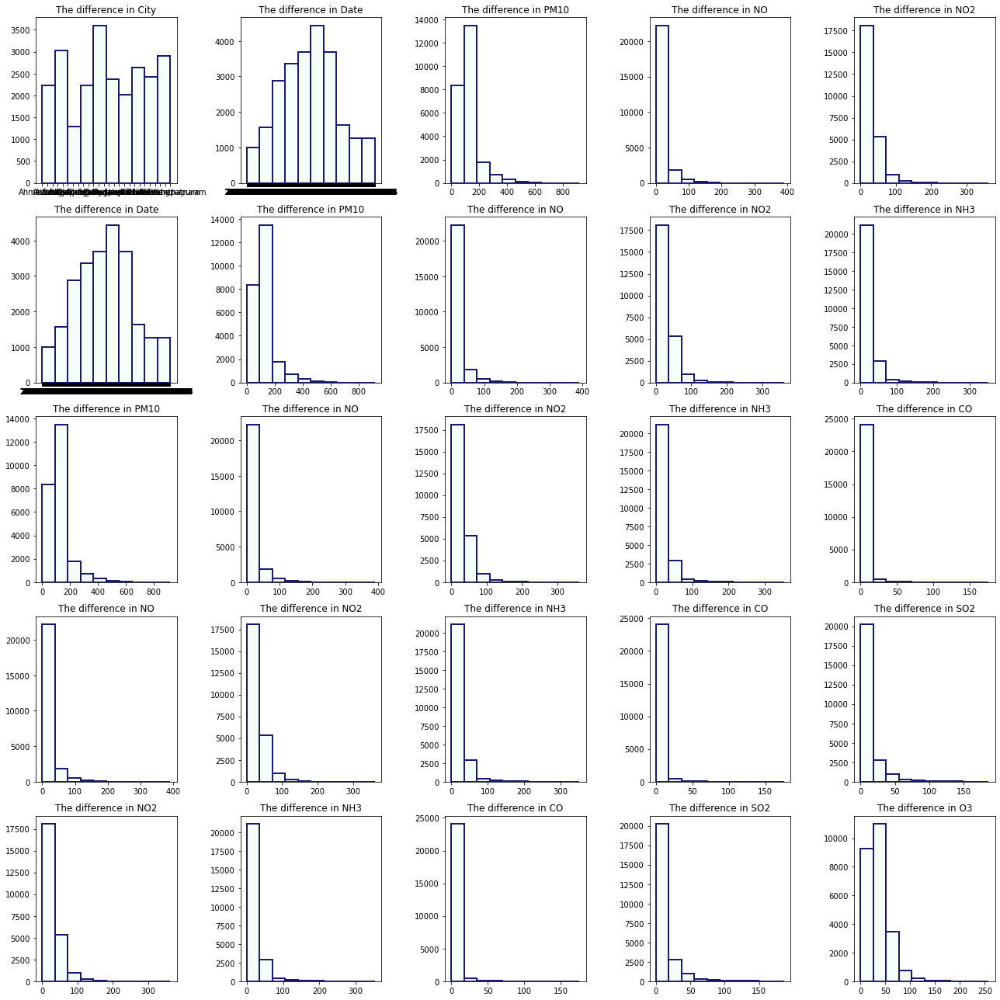

In [84]:
fig, axes = plt.subplots(5,5)
columns = ['City','Date','PM10','NO','NO2','NH3','CO','SO2','O3','Benzene','Toluene','Xylene','AQI','AQI_Bucket']
for i in range(5):
    for j in range(5):
        axes[i,j].hist(x = columns[i+j], linewidth =2, data = df2 , edgecolor = 'midnightblue', color = 'mintcream')
        axes[i,j].set_title('The difference in '+columns[i+j])
fig=plt.gcf()
fig.set_size_inches(18,18)
fig.tight_layout()

<AxesSubplot:>

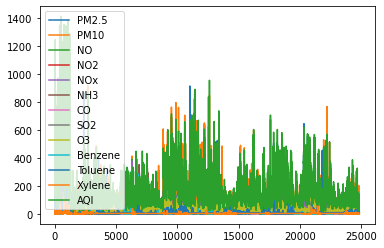

In [85]:
df2.plot()

In [86]:
df2.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,Poor
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,Very Poor
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,Severe
3,Ahmedabad,2015-02-01,135.99,118.127103,43.48,42.08,84.57,23.483476,43.48,75.23,102.70,0.40,0.04,25.87,782.0,Severe
4,Ahmedabad,2015-02-02,178.33,118.127103,54.56,35.31,72.80,23.483476,54.56,55.04,107.38,0.46,0.06,35.61,914.0,Severe


In [87]:
#Label Encoder 

LabelEncoder can be used to normalize labels. It can also be used to transform non-numerical labels (as long as they are hashable and comparable) to numerical labels. Fit label encoder.

In [88]:
from sklearn import preprocessing

In [89]:
lc = preprocessing.LabelEncoder()

In [90]:
df2['AQI_Bucket']  = lc.fit_transform(df2['AQI_Bucket'])

<ipython-input-90-da727ff1db8f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [91]:
df2.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-29,83.13,118.127103,6.93,28.71,33.72,23.483476,6.93,49.52,59.76,0.02,0.00,3.14,209.0,2
1,Ahmedabad,2015-01-30,79.84,118.127103,13.85,28.68,41.08,23.483476,13.85,48.49,97.07,0.04,0.00,4.81,328.0,5
2,Ahmedabad,2015-01-31,94.52,118.127103,24.39,32.66,52.61,23.483476,24.39,67.39,111.33,0.24,0.01,7.67,514.0,4
3,Ahmedabad,2015-02-01,135.99,118.127103,43.48,42.08,84.57,23.483476,43.48,75.23,102.70,0.40,0.04,25.87,782.0,4
4,Ahmedabad,2015-02-02,178.33,118.127103,54.56,35.31,72.80,23.483476,54.56,55.04,107.38,0.46,0.06,35.61,914.0,4


In [92]:
df2['AQI_Bucket'] 

0        2
1        5
2        4
3        4
4        4
        ..
24845    0
24846    3
24847    3
24848    3
24849    0
Name: AQI_Bucket, Length: 24778, dtype: int32

In [93]:
#SKEWNESS and KURTOSis

Skewness essentially measures the relative size of the two tails. Kurtosis is a measure of the combined sizes of the two tails. It measures the amount of probability in the tails. The value is often compared to the kurtosis of the normal distribution, which is equal to 3.

In [94]:
print("Skewness: %f" % df2['AQI_Bucket'].skew())
print("Kurtosis: %f" % df2['AQI_Bucket'].kurt())

Skewness: 0.398593
Kurtosis: -0.715694


In [95]:
df2.drop(['Date'],inplace = True,axis = 1)

C:\Users\HI\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
df2['City'] = lc.fit_transform(df2['City'])

<ipython-input-96-69374fd46e9d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [97]:
df2['City'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25])

In [98]:
df2['City'].value_counts()

10    1999
4     1910
19    1893
8     1884
14    1880
21    1459
12    1453
0     1309
25    1171
3     1126
15    1094
24    1052
2      841
20     775
16     771
18     754
6      713
23     686
13     495
9      344
7      299
5      278
22     196
17     158
11     153
1       85
Name: City, dtype: int64

In [99]:
x = df2.drop(['AQI_Bucket'], axis = 1)

In [100]:
y = df2['AQI_Bucket']

In [101]:
#Training & Testing the data

In [102]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

In [103]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size = 0.33, random_state = 0)

In [ ]:
# s

In [104]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [105]:
#Multi class Logistic Regression

Logistic regression analysis is a popular and widely used analysis that is similar to linear regression analysis except that the outcome is dichotomous (e.g., success/failure or yes/no or died/lived).
I'm using Multiclass or multinomial classification: three or more classes of the outputs to choose from

In [106]:
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs')

In [107]:
lr.fit(x_train,y_train)

C:\Users\HI\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(multi_class='multinomial')

In [108]:
y_pred = lr.predict(x_test)

In [109]:
y_pred

array([3, 3, 3, ..., 1, 2, 5])

In [110]:
from sklearn.metrics import accuracy_score

In [111]:
acc_score = accuracy_score(y_pred,y_test)

In [112]:
acc_score

0.9521829521829522

In [113]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

In [114]:
cm 

array([[ 310,    1,    0,  141,    0,    0],
       [   0, 2791,    9,   62,    0,    2],
       [   0,   43,  867,    0,    0,   34],
       [   4,   53,    0, 2674,    0,    0],
       [   0,    0,    0,    0,  439,   18],
       [   0,    0,   22,    0,    2,  705]], dtype=int64)

In [115]:
from sklearn.metrics import classification_report

Classification_Report

In [116]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.69      0.81       452
           1       0.97      0.97      0.97      2864
           2       0.97      0.92      0.94       944
           3       0.93      0.98      0.95      2731
           4       1.00      0.96      0.98       457
           5       0.93      0.97      0.95       729

    accuracy                           0.95      8177
   macro avg       0.96      0.91      0.93      8177
weighted avg       0.95      0.95      0.95      8177



In [117]:
#GaussianNB

Gaussian Naive Bayes is a variant of Naive Bayes that follows Gaussian normal distribution and supports continuous data. ... Naive Bayes are a group of supervised machine learning classification algorithms based on the Bayes theorem. It is a simple classification technique, but has high functionality.

In [118]:
from sklearn.naive_bayes import GaussianNB

In [119]:
model = GaussianNB()

In [120]:
model.fit(x_train,y_train)

GaussianNB()

In [121]:
y_pred_1 = model.predict(x_test)

In [122]:
y_pred_1

array([3, 3, 3, ..., 1, 2, 5])

In [123]:
acc_score_nb = accuracy_score(y_pred_1,y_test)

In [124]:
acc_score_nb

0.8430964901553137

In [125]:
cm = confusion_matrix(y_test, y_pred_1)

In [126]:
cm

array([[ 406,    7,    0,   38,    1,    0],
       [   0, 2400,  104,  301,   59,    0],
       [   0,   61,  813,    1,   39,   30],
       [ 167,  235,    0, 2321,    8,    0],
       [   0,    0,    0,    0,  373,   84],
       [   0,    0,   84,    0,   64,  581]], dtype=int64)

In [127]:
#Classification Report

In [128]:
print(classification_report(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.71      0.90      0.79       452
           1       0.89      0.84      0.86      2864
           2       0.81      0.86      0.84       944
           3       0.87      0.85      0.86      2731
           4       0.69      0.82      0.75       457
           5       0.84      0.80      0.82       729

    accuracy                           0.84      8177
   macro avg       0.80      0.84      0.82      8177
weighted avg       0.85      0.84      0.84      8177



In [129]:
#SVM

Support Vector Machine” (SVM) is a supervised machine learning algorithm which can be used for both classification or regression challenges. ... Support Vectors are simply the co-ordinates of individual observation. The SVM classifier is a frontier which best segregates the two classes (hyper-plane/ line).

In [130]:
from sklearn import svm

In [131]:
model_2 = svm.SVC(kernel='linear')

In [132]:
model_2.fit(x_train,y_train)

SVC(kernel='linear')

In [133]:
y_pred_2 = model_2.predict(x_test)

In [134]:
acc_score_svm = accuracy_score(y_pred_2,y_test)

In [135]:
acc_score_svm

0.9855692796869268

In [136]:
#Classification Report

In [137]:
print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95       452
           1       0.99      1.00      0.99      2864
           2       0.99      0.97      0.98       944
           3       0.98      0.99      0.99      2731
           4       0.99      0.98      0.99       457
           5       0.97      0.99      0.98       729

    accuracy                           0.99      8177
   macro avg       0.99      0.97      0.98      8177
weighted avg       0.99      0.99      0.99      8177



In [138]:
#RandomForestClassifier

Random Forests  is used for both classification and regression. Random forests is a supervised learning algorithm. ... Random forests creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting

In [139]:
from sklearn.ensemble import RandomForestClassifier

In [1]:
model_ =RandomForestClassifier(n_estimators=700)

NameError: name 'RandomForestClassifier' is not defined

In [141]:
model_3.fit(x_train,y_train)

RandomForestClassifier()

In [142]:
y_pred_3 = model_3.predict(x_test)

In [143]:
acc_score_rfm = accuracy_score(y_pred_3,y_test)

In [144]:
acc_score_rfm

0.9992662345603522

In [145]:
#Classification_Report

In [146]:
print(classification_report(y_test, y_pred_3))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       452
           1       1.00      1.00      1.00      2864
           2       1.00      1.00      1.00       944
           3       1.00      1.00      1.00      2731
           4       1.00      1.00      1.00       457
           5       0.99      1.00      1.00       729

    accuracy                           1.00      8177
   macro avg       1.00      1.00      1.00      8177
weighted avg       1.00      1.00      1.00      8177

